<a href="https://colab.research.google.com/github/sangjunyoo-phd/PINN-2D-HeatEquation/blob/main/2D_Heat_Eq_PINN_exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2D Heat Equation

The aim of the model is to solve and predict the heat function $u(x,y;t)$ that follows the PDE below.

$${du \over dt} = \alpha \left({\partial^2u \over \partial x^2}+{\partial ^2u \over \partial y^2}\right)$$

$\alpha$ is a thermal diffusivity of the medium (coefficient). The model takes three variables $x, y, t$ and outputs $u$.

In [ ]:
import torch
import torch.nn as nn
import numpy as np

In [ ]:
# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device Used:", device)

Device Used: cuda


# Define Model with Pytorch

For NN to solve ODE/PDE, the output of the network should be smooth and continouous. Derivable functions are used for activation, such as nn.Tanh and nn.Sigmoid instead of nn.ReLU.


In [ ]:
# Define Neural Net
class Heat2DNet(nn.Module):
  def __init__(self, num_nodes:list[int]):
    super().__init__() # Inherit methods from nn.Module
    if num_nodes[0] != 3:
      raise ValueError("Input size should be 3 (x, y, t)")
    if num_nodes[-1] != 1:
      raise ValueError("Output size should be 1 (u)")

    # Define Sequential network with list of the number of nodes
    list_layers = []
    for i in range(len(num_nodes)-1):
      layer = nn.Linear(num_nodes[i], num_nodes[i+1])
      list_layers.append(layer)
      # Add nn.Tanh activation except for the last layer
      if i < len(num_nodes)-1:
        list_layers.append(nn.Tanh())
    # Unpack the list_layers and pass to the nn.Sequential to build the network
    self.layers = nn.Sequential(*list_layers)

  def forward(self, x):
    return self.layers(x)


# Define Loss Function

Loss functions of PINN is defined with two parts: residual, initial condition, and boundary condition loss.

* Residual loss enforces the model output follow the ODE/PDE
* Initial condition loss enforces the model follow the initial (t=0)
* Boundary condition loss enforces the model follow the boundary condition

## Residual loss

In our case, the residue of the PDE is

$$res = {du \over dt} - \alpha \left( {\partial^2 u \over \partial x^2} + {\partial ^2 u \over \partial y^2} \right)$$

and we want the $res$ value to become close to zero as much as possible.

In [ ]:
alpha = 0.1

In [ ]:
def get_loss_res(model, data_point, alpha):
  # parse the data_point to get x, y, and t tensors
  x = data_point[:, 0:1] # [:,0:1] instead of [:,0] -> keep the dimension of the sliced tensor
  y = data_point[:, 1:2]
  t = data_point[:, 2:3]
  # Redefine the derivable data tensor
  # It is nice to preserve the raw data and create separate model inputs
  x.requires_grad_(True)
  y.requires_grad_(True)
  t.requires_grad_(True)
  data = torch.cat([x, y, t], dim=1)
  # Forward pass
  u_pred = model(data)

  # 1st order derivatives
  u_t = torch.autograd.grad(
      u_pred, t,
      grad_outputs=torch.ones_like(u_pred),
      create_graph=True, # Enables high order higher derivatives
      retain_graph=True # Preserves the graph for higher order derivatives
      )[0]
  u_x = torch.autograd.grad(
      u_pred, x,
      grad_outputs=torch.ones_like(u_pred),
      create_graph=True,
      retain_graph=True
      )[0]
  u_y = torch.autograd.grad(
      u_pred, y,
      grad_outputs=torch.ones_like(u_pred),
      create_graph=True,
      retain_graph=True
      )[0]

  # 2nd order derivatives
  u_xx = torch.autograd.grad(
      u_x, x,
      grad_outputs=torch.ones_like(u_x),
      retain_graph=True
      )[0]
  u_yy = torch.autograd.grad(
      u_y, y,
      grad_outputs=torch.ones_like(u_y),
      retain_graph=True
      )[0]

  res = u_t - alpha * (u_xx + u_yy)
  return torch.mean(res**2)

## Initial condition loss

In [ ]:
def get_loss_ic(model, data_point, u_ic_true):
  x = data_point[:, 0:1]
  y = data_point[:, 1:2]
  t = data_point[:, 2:3]
  data = torch.cat([x, y, t], dim=1)
  data.requires_grad_(True)
  u_pred = model(data)
  return torch.mean((u_pred - u_ic_true)**2)

## Boundary condition loss

We assume zero heat flux from the isolated 2-D square plate for this example.

For the spatial domain,
$$
x \in [0,1] \\
y \in [0,1] \\
$$

we assume
$$
{\partial u \over \partial x} |_{x=0, 1}=0 \\
{\partial u \over \partial y} |_{y=0, 1}=0
$$

In [ ]:
def get_loss_bc(model, data_point):
  x = data_point[:, 0:1]
  y = data_point[:, 1:2]
  t = data_point[:, 2:3]

  x.requires_grad_(True)
  y.requires_grad_(True)
  t.requires_grad_(True)

  data = torch.cat([x, y, t], dim=1)
  u_pred = model(data)

  u_x = torch.autograd.grad(
      u_pred, x,
      grad_outputs=torch.ones_like(u_pred),
      create_graph=True,
      retain_graph=True
      )[0]

  u_y = torch.autograd.grad(
      u_pred, y,
      grad_outputs=torch.ones_like(u_pred),
      create_graph=True,
      retain_graph=True
      )[0]

  # gradient near x=0,1 and y=0, should be near zero
  zero_tensor = torch.tensor(0., device=device)
  one_tensor = torch.tensor(1., device=device)
  bc_x = (torch.isclose(x, zero_tensor, atol=1e-5) | torch.isclose(x, one_tensor, atol=1e-5))
  bc_y = (torch.isclose(y, zero_tensor, atol=1e-5) | torch.isclose(y, one_tensor, atol=1e-5))

  loss_bc_x = torch.mean((u_x[bc_x])**2)
  loss_bc_y = torch.mean((u_y[bc_y])**2)

  return loss_bc_x + loss_bc_y

## Measurement Loss

Loss calculated from measured values.

In [ ]:
# To simulate the measured values
def analytical_solution_torch(x, y, t):
  return torch.sin(np.pi * x) * torch.cos(np.pi * y) * torch.exp(-np.pi**2 * alpha * t)

def get_loss_meas(model, data_point, u_meas_true):
  u_meas_pred = model(data_point)
  loss_meas = torch.mean((u_meas_pred - u_meas_true)**2)
  return loss_meas

# Sampling

The data will generated from the sampled points. Herein, define the domain range, and sample points for pde and initial condition.

$$
x \in [0,1] \\
y \in [0,1] \\
t \in [0,1] \\
$$

Initial condition
$$u(x,y,t=0)=sin(\pi x)*cos(\pi y)$$

In [ ]:
# Define domain
x_min, x_max = 0, 1
y_min, y_max = 0, 1
t_min, t_max = 0, 1

In [ ]:
# Number of samples for res and ic
n_res = 50000
n_ic = 5000
n_bc = 2000

# Number of Measurements
n_meas = 2000

In [ ]:
# Sample points randomly
# For PDE
x_res = torch.rand(n_res, 1, device=device) * (x_max - x_min) + x_min
y_res = torch.rand(n_res, 1, device=device) * (y_max - y_min) + y_min
t_res = torch.rand(n_res, 1, device=device)**2 * (t_max - t_min) + t_min # Square the random sampling to sample near t=0 more
data_res = torch.cat([x_res, y_res, t_res], dim=1)

# For Initial Condition
x_ic = torch.rand(n_ic, 1, device=device)
y_ic = torch.rand(n_ic, 1, device=device)
t_ic = torch.zeros_like(x_ic) # t=0
data_ic = torch.cat([x_ic, y_ic, t_ic], dim=1)
u_ic_true = torch.sin(np.pi * x_ic) * torch.cos(np.pi * y_ic)

# For Boundary Condition
# x=0, y=0~1
x_bc_x0 = torch.zeros(n_bc, 1, device=device)
y_bc_x0 = torch.rand(n_bc, 1, device=device) * (y_max - y_min) + y_min
t_bc_x0 = torch.rand(n_bc, 1, device=device) * (t_max - t_min) + t_min
data_bc = torch.cat([x_bc_x0, y_bc_x0, t_bc_x0], dim=1)
# x=1, y=0~1
x_bc_x1 = torch.ones(n_bc, 1, device=device)
y_bc_x1 = torch.rand(n_bc, 1, device=device) * (y_max - y_min) + y_min
t_bc_x1 = torch.rand(n_bc, 1, device=device) * (t_max - t_min) + t_min
data_bc = torch.cat([data_bc,
                     torch.cat([x_bc_x1, y_bc_x1, t_bc_x1], dim=1)],
                    dim = 0)
# y=0, x=0~1
x_bc_y0 = torch.rand(n_bc, 1, device=device) * (x_max - x_min) + x_min
y_bc_y0 = torch.zeros(n_bc, 1, device=device)
t_bc_y0 = torch.rand(n_bc, 1, device=device) * (t_max - t_min) + t_min
data_bc = torch.cat([data_bc,
                     torch.cat([x_bc_y0, y_bc_y0, t_bc_y0], dim=1)],
                    dim=0)
# y=1, x=0~1
x_bc_y1 = torch.rand(n_bc, 1, device=device) * (x_max - x_min) + x_min
y_bc_y1 = torch.ones(n_bc, 1, device=device)
t_bc_y1 = torch.rand(n_bc, 1, device=device) * (t_max - t_min) + t_min
data_bc = torch.cat([data_bc,
                     torch.cat([x_bc_y1, y_bc_y1, t_bc_y1], dim=1)],
                    dim=0)

x_meas = torch.rand(n_meas, 1, device=device)
y_meas = torch.rand(n_meas, 1, device=device)
t_meas = torch.rand(n_meas, 1, device=device) * (t_max - t_min) + t_min

data_meas = torch.cat([x_meas, y_meas, t_meas], dim=1)
u_meas_true = analytical_solution_torch(x_meas, y_meas, t_meas)

# Training

In [ ]:
# Hyperparameters
epochs = 5000
lr = 1e-3
coef_ic = 10
coef_bc = 10
coef_meas = 10

In [ ]:
# Model and optimizer
model = Heat2DNet([3, 128,128,128,128,128,128,128,128, 1])
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.85)

# Send data to GPU as well
data_res = data_res.to(device)
data_ic = data_ic.to(device)
u_ic_true = u_ic_true.to(device)

In [ ]:
# Training loop
list_loss = []
list_loss_res = []
list_loss_ic = []
list_loss_bc = []
list_loss_meas = []

for epoch in range(epochs):
  # PyTorch "ACCUMULATES" the gradients instead of updates them.
  # Need to initialize to zero in each batch.
  # In this code, we pass all data at once (num_batch = 1)
  optimizer.zero_grad()

  # Calculate loss
  loss_res = get_loss_res(model, data_res, alpha)
  loss_ic = get_loss_ic(model, data_ic, u_ic_true)
  loss_bc = get_loss_bc(model, data_bc)
  loss_meas = get_loss_meas(model, data_meas, u_meas_true)
  loss = loss_res + coef_ic * loss_ic + coef_bc * loss_bc + coef_meas * loss_meas
  list_loss.append(loss.item())
  list_loss_res.append(loss_res.item())
  list_loss_ic.append(loss_ic.item())
  list_loss_bc.append(loss_bc.item())
  list_loss_meas.append(loss_meas.item())

  # Backpropagation
  loss.backward()

  # Update parameters
  optimizer.step()
  scheduler.step()

  # Print progression every 100 epochs
  if epoch % 100 == 0:
    print(f"Epoch {epoch} | Loss: {loss.item():.6f} | Res: {loss_res.item():.6f} | IC: {loss_ic.item():.6f} | BC: {loss_bc.item():.6f} | Meas: {loss_meas.item():.6f} | lr: {optimizer.param_groups[0]['lr']:.6f}")

print("Training complete!")

Epoch 0 | Loss: 3.669091 | Res: 0.000006 | IC: 0.256547 | BC: 0.000006 | Meas: 0.110355 | lr: 0.001000
Epoch 100 | Loss: 0.912960 | Res: 0.152688 | IC: 0.051079 | BC: 0.003090 | Meas: 0.021858 | lr: 0.001000
Epoch 200 | Loss: 0.767525 | Res: 0.033141 | IC: 0.047618 | BC: 0.004313 | Meas: 0.021507 | lr: 0.001000
Epoch 300 | Loss: 0.706532 | Res: 0.032307 | IC: 0.046279 | BC: 0.000950 | Meas: 0.020194 | lr: 0.001000
Epoch 400 | Loss: 0.684764 | Res: 0.015259 | IC: 0.045724 | BC: 0.001211 | Meas: 0.020016 | lr: 0.001000
Epoch 500 | Loss: 0.691329 | Res: 0.024545 | IC: 0.045116 | BC: 0.001585 | Meas: 0.019977 | lr: 0.000850
Epoch 600 | Loss: 0.666808 | Res: 0.013949 | IC: 0.043285 | BC: 0.002387 | Meas: 0.019614 | lr: 0.000850
Epoch 700 | Loss: 1.025259 | Res: 0.361881 | IC: 0.042261 | BC: 0.004551 | Meas: 0.019526 | lr: 0.000850
Epoch 800 | Loss: 0.606397 | Res: 0.227076 | IC: 0.020243 | BC: 0.002722 | Meas: 0.014967 | lr: 0.000850
Epoch 900 | Loss: 0.739755 | Res: 0.402618 | IC: 0.019958

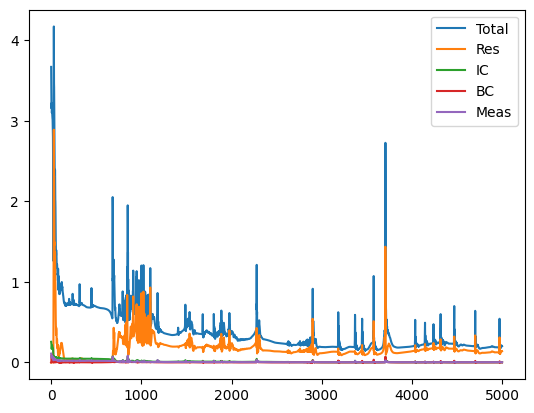

In [ ]:
import matplotlib.pyplot as plt
plt.plot(list_loss)
plt.plot(list_loss_res)
plt.plot(list_loss_ic)
plt.plot(list_loss_bc)
plt.plot(list_loss_meas)
plt.legend(["Total", "Res", "IC", "BC", "Meas"])
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def visualize_animation():
    fig, ax = plt.subplots(figsize=(8, 6))

    x_grid = np.linspace(0, 1, 100)
    y_grid = np.linspace(0, 1, 100)
    X, Y = np.meshgrid(x_grid, y_grid)
    xy_grid = np.hstack([X.flatten()[:, None], Y.flatten()[:, None]])
    t_values = np.linspace(0, 1.5, 100)  # Increased frames for smoother animation

    vmin = -1  # Set vmin and vmax for consistent colorbar
    vmax = 1


    im = ax.imshow(np.zeros_like(X), extent=[0, 1, 0, 1], origin='lower', cmap='inferno', vmin=vmin, vmax=vmax)
    fig.colorbar(im)

    def update(i):
        t_grid = np.ones_like(X.flatten()) * t_values[i]
        data_grid = torch.tensor(np.hstack([xy_grid, t_grid[:, None]]), dtype=torch.float32, device=device)
        u_pred_grid = model(data_grid).detach().cpu().numpy()
        U = u_pred_grid.reshape(X.shape)
        im.set_array(U)
        ax.set_title(f'Heat Equation Solution with PINN\n(t={t_values[i]:.2f})', fontsize=16, fontweight='bold')  # Added title
        return [im]

    ani = FuncAnimation(fig, update, frames=len(t_values), blit=True, interval=50)

    # Save animation as a video file
    ani.save('heat_equation_pinn.mp4', writer='ffmpeg', fps=20)

    plt.close(fig) # Close the figure to free resources.

    return ani

# Display the animation
HTML(visualize_animation().to_jshtml())

In [ ]:
# analytical solution
def analytical_solution(x, y, t):
  return np.sin(np.pi * x) * np.cos(np.pi * y) * np.exp(-np.pi**2 * alpha * t)

In [ ]:
def visualize_analytical_animation():
    fig, ax = plt.subplots(figsize=(8, 6))

    x_grid = np.linspace(0, 1, 100)
    y_grid = np.linspace(0, 1, 100)
    X, Y = np.meshgrid(x_grid, y_grid)
    t_values = np.linspace(0, 1.5, 100)
    t_grid = np.ones_like(X.flatten()) * t_values[0]

    vmin = -1
    vmax = 1

    im = ax.imshow(np.zeros_like(X), extent=[0, 1, 0, 1], origin='lower', cmap='inferno', vmin=vmin, vmax=vmax)
    fig.colorbar(im)

    def update(i):
        t_grid = np.ones_like(X.flatten()) * t_values[i]
        U = analytical_solution(X, Y, t_values[i])
        im.set_array(U)
        ax.set_title(f'Analytical Solution\n(t={t_values[i]:.2f})', fontsize=16, fontweight='bold')
        return [im]

    ani = FuncAnimation(fig, update, frames=len(t_values), blit=True, interval=50)
    ani.save('analytical_solution.mp4', writer='ffmpeg', fps=20)
    plt.close(fig)

    return ani

# Display the animation
HTML(visualize_analytical_animation().to_jshtml())

In [ ]:
import cv2
import numpy as np

# Load the two videos
video1 = cv2.VideoCapture('heat_equation_pinn.mp4')
video2 = cv2.VideoCapture('analytical_solution.mp4')

# Get video properties
width1 = int(video1.get(cv2.CAP_PROP_FRAME_WIDTH))
height1 = int(video1.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps1 = video1.get(cv2.CAP_PROP_FPS)

width2 = int(video2.get(cv2.CAP_PROP_FRAME_WIDTH))
height2 = int(video2.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps2 = video2.get(cv2.CAP_PROP_FPS)

# Use the properties of the first video as reference.  Adjust if necessary.
fps = fps1
width = width1 * 2  # Side-by-side, so double the width
height = height1

# Create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Or use 'XVID' if mp4v doesn't work
output_video = cv2.VideoWriter('combined_video.mp4', fourcc, fps, (width, height))

while True:
    ret1, frame1 = video1.read()
    ret2, frame2 = video2.read()

    if not ret1 or not ret2:
        break

    # Resize frames if necessary (ensure consistent dimensions)
    frame1 = cv2.resize(frame1, (width1, height1))
    frame2 = cv2.resize(frame2, (width1, height1))

    # Horizontally stack the frames
    combined_frame = np.hstack((frame1, frame2))

    # Write the combined frame to the output video
    output_video.write(combined_frame)


# Release resources
video1.release()
video2.release()
output_video.release()

print("Combined video saved as combined_video.mp4")


Combined video saved as combined_video.mp4
